In [1]:
# ───────────────────────────────
# 📦 Standard Libraries
# ───────────────────────────────
import os
import sys
import math
import time
import csv
import pickle
from datetime import datetime, timedelta
from collections import Counter

# ───────────────────────────────
# 📚 Data Handling & Utilities
# ───────────────────────────────
import numpy as np
import pandas as pd
from glob import glob
from tqdm import tqdm
import h5py
from joblib import dump, load

# ───────────────────────────────
# 📊 Visualization
# ───────────────────────────────
import matplotlib.pyplot as plt
import seaborn as sns

# ───────────────────────────────
# 📈 Machine Learning
# ───────────────────────────────
from sklearn.model_selection import (
    train_test_split, RandomizedSearchCV, GridSearchCV, cross_val_score
)
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score, roc_curve, roc_auc_score, auc,
    classification_report, confusion_matrix
)
from sklearn.preprocessing import LabelEncoder, StandardScaler
from imblearn.under_sampling import RandomUnderSampler

# ───────────────────────────────
# 🌍 Seismology & Signal Processing
# ───────────────────────────────
import obspy
from obspy import UTCDateTime
from obspy.geodetics.base import gps2dist_azimuth
from obspy.clients.fdsn import Client
from obspy.signal.filter import envelope
from scipy import stats, signal

# ───────────────────────────────
# 🔗 External Tools
# ───────────────────────────────
from zenodo_get import zenodo_get

# ───────────────────────────────
# 🤖 Deep Learning
# ───────────────────────────────
import torch
import torch.nn.functional as F


# ───────────────────────────────
# 🛠 Custom Utilities
# ───────────────────────────────
sys.path.insert(0, '/home/ak287/PNW_Seismic_Event_Classification/deep_learning/scripts')
from neural_network_architectures import SeismicCNN_2d

from utils import (
    extract_waveforms,
    compute_spectrogram,
    normalize_spectrogram_minmax,
    return_train_val_loaders,
    plot_confusion_matrix_and_cr,
    train_model,
    WaveformPreprocessor
)
from collections import defaultdict

# Pandas display options
pd.set_option('display.max_columns', None)


sys.path.append('/home/ak287/seisbench/seisbench/models')
import seisbench.models as sbm



# for extracting unique stations
import re
from pathlib import Path
from scipy.signal import hilbert, savgol_filter

cuda


In [2]:
# extracting the catalog
comcat_file_csv = pd.read_csv("/data/whd01/yiyu_data/PNWML/comcat_metadata.csv")
exotic_file_csv = pd.read_csv("/data/whd01/yiyu_data/PNWML/exotic_metadata.csv")
noise_file_csv = pd.read_csv("/data/whd01/yiyu_data/PNWML/noise_metadata.csv")



# extracting the metadata corresponding to individual events
cat_exp = comcat_file_csv[comcat_file_csv['source_type'] == 'explosion']
cat_eq = comcat_file_csv[comcat_file_csv['source_type'] == 'earthquake']
cat_no = noise_file_csv
cat_su = exotic_file_csv[exotic_file_csv['source_type'] == 'surface event']

In [6]:
np.unique(cat_su['station_code'], return_counts = True)

(array(['ASBU', 'ASR', 'B201', 'B202', 'B203', 'B204', 'B941', 'BERY',
        'BHAM', 'BKC', 'BLOW', 'BRSP', 'BVW', 'CARB', 'CDF', 'CIHL', 'CMM',
        'CPCO', 'CRBN', 'DONK', 'EDM', 'ELK', 'ETW', 'F05D', 'FHE', 'FL2',
        'FMW', 'FRIS', 'G05D', 'GBL', 'GLK', 'GRUT', 'GSM', 'GUL', 'HDW',
        'HIYU', 'HOA', 'HOOD', 'HSR', 'HUO', 'HUSB', 'IRO', 'JCW', 'JRO',
        'JUN', 'KOS', 'KWBU', 'LCW', 'LO2', 'LOC', 'LON', 'LSON', 'LVP',
        'MBW', 'MDW', 'MEW', 'MIDE', 'MJ2', 'MOON', 'MTM', 'MULN', 'NCO',
        'NED', 'NN17', 'NN19', 'NN21', 'NN32', 'NORM', 'OBSR', 'OPCH',
        'OT3', 'PALM', 'PANH', 'PARA', 'PINE', 'PR05', 'PRLK', 'RAFT',
        'RCM', 'RCS', 'REM', 'RER', 'RPW', 'RPW2', 'RSW', 'RUSH', 'RVC',
        'RVW', 'SAXON', 'SEP', 'SHRK', 'SHUK', 'SHW', 'SIFT', 'SOS',
        'SPN5', 'STAR', 'STD', 'STOR', 'SUG', 'SVIC', 'SWF2', 'SWFL',
        'SWNB', 'TBM', 'TCBU', 'TDH', 'TDL', 'TIMB', 'TMBU', 'TWW', 'VALT',
        'VBE', 'VDEB', 'VFP', 'VLL', 'VOIT', 'WA2', '

In [7]:
np.unique(cat_eq['station_code'], return_counts = True)

(array(['A04A', 'A04D', 'A05A', 'A06A', 'A07A', 'A08A', 'A09A', 'A10A',
        'ABER', 'ALKI', 'ALSE', 'ANGUS', 'ARAT', 'ARTIC', 'ASBU', 'ASR',
        'ASR2', 'ATES', 'AUG', 'AWST', 'B001', 'B003', 'B004', 'B005',
        'B006', 'B007', 'B011', 'B012', 'B013', 'B014', 'B017', 'B018',
        'B019', 'B020', 'B022', 'B023', 'B024', 'B026', 'B028', 'B030',
        'B031', 'B032', 'B033', 'B035', 'B036', 'B040', 'B04A', 'B05A',
        'B05D', 'B06A', 'B07A', 'B08A', 'B09A', 'B201', 'B202', 'B203',
        'B204', 'B926', 'B927', 'B928', 'B941', 'B943', 'BABR', 'BBO',
        'BDGR', 'BEER', 'BEN', 'BEND', 'BERY', 'BES3', 'BES4', 'BES5',
        'BFSB', 'BHAM', 'BHCR', 'BHW', 'BIB', 'BICK', 'BKC', 'BLN', 'BLOW',
        'BLT', 'BMO', 'BOIS', 'BOW', 'BOW2', 'BPO', 'BRAN', 'BRO', 'BRSP',
        'BRV', 'BTB', 'BUCK', 'BUO', 'BVW', 'C03A', 'C04A', 'C05A', 'C06A',
        'C06D', 'C07A', 'C08A', 'C09A', 'CARB', 'CAVE', 'CBB', 'CBS',
        'CCRK', 'CDF', 'CHIL', 'CHIMA', 'CHUCK', 'CIHL', 

In [8]:
cat_su

,event_id,source_type,station_network_code,station_channel_code,station_code,station_location_code,station_latitude_deg,station_longitude_deg,station_elevation_m,trace_name,trace_sampling_rate_hz,trace_start_time,trace_S_arrival_sample,trace_S_onset,trace_P_arrival_sample,trace_P_onset,trace_snr_db
355,pnsn3179368,surface event,UW,HH,RCM,--,46.836,-121.733,3085.0,"bucket1$0,:3,:18001",100,2021-12-22T04:48:25.000000Z,NaN,NaN,7000.0,emergent,6.493|2.298|0.447
356,pnsn3179093,surface event,CC,BH,VALT,--,46.214,-122.189,1681.0,"bucket1$1,:3,:18001",100,2021-12-19T07:31:56.000000Z,NaN,NaN,7000.0,emergent,-2.019|1.492|-1.325
357,pnsn3179088,surface event,CC,BH,HOA,--,46.242,-122.192,1151.0,"bucket1$2,:3,:18001",100,2021-12-19T07:27:38.000000Z,NaN,NaN,7000.0,emergent,6.657|-3.429|8.158
358,pnsn3178938,surface event,UW,HH,RCM,--,46.836,-121.733,3085.0,"bucket1$3,:3,:18001",100,2021-12-17T16:47:57.000000Z,NaN,NaN,7000.0,emergent,10.592|16.458|17.760
359,pnsn3177563,surface event,CC,BH,SEP,--,46.200,-122.191,2114.0,"bucket1$4,:3,:18001",100,2021-12-07T09:43:06.000000Z,NaN,NaN,7000.0,emergent,-0.222|6.356|2.264
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9262,pnsn830593,surface event,UW,EH,EDM,--,46.197,-122.151,1609.0,"bucket1$8993,:3,:18001",100,2002-01-02T17:37:11.000000Z,NaN,NaN,7000.0,impulsive,nan|nan|-1.162
9263,pnsn830593,surface event,UW,EH,YEL,--,46.209,-122.189,1750.0,"bucket1$8994,:3,:18001",100,2002-01-02T17:37:09.000000Z,NaN,NaN,7000.0,impulsive,nan|nan|14.469
9264,pnsn830593,surface event,UW,EH,SEP,--,46.200,-122.191,2116.0,"bucket1$8995,:3,:18001",100,2002-01-02T17:37:09.000000Z,NaN,NaN,7000.0,impulsive,nan|nan|4.575
9265,pnsn829903,surface event,UW,EH,YEL,--,46.209,-122.189,1750.0,"bucket1$8996,:3,:18001",100,2002-01-01T21:33:40.000000Z,NaN,NaN,7000.0,impulsive,nan|nan|12.728


In [9]:
cat_eq

,event_id,source_origin_time,source_latitude_deg,source_longitude_deg,source_type,source_depth_km,preferred_source_magnitude,preferred_source_magnitude_type,preferred_source_magnitude_uncertainty,source_depth_uncertainty_km,source_horizontal_uncertainty_km,station_network_code,station_channel_code,station_code,station_location_code,station_latitude_deg,station_longitude_deg,station_elevation_m,trace_name,trace_sampling_rate_hz,trace_start_time,trace_S_arrival_sample,trace_P_arrival_sample,trace_S_arrival_uncertainty_s,trace_P_arrival_uncertainty_s,trace_P_polarity,trace_S_onset,trace_P_onset,trace_snr_db,source_type_pnsn_label,source_local_magnitude,source_local_magnitude_uncertainty,source_duration_magnitude,source_duration_magnitude_uncertainty,source_hand_magnitude,trace_missing_channel,trace_has_offset
0,uw10564613,2002-10-03T01:56:49.530000Z,48.553,-122.520,earthquake,14.907,2.10,md,0.030,1.68,0.694,UW,BH,GNW,--,47.564,-122.825,220.0,"bucket4$0,:3,:15001",100,2002-10-03T01:55:59.530000Z,8097,6733,0.04,0.02,undecidable,NaN,NaN,6.135|3.065|11.766,eq,NaN,NaN,2.10,0.030,NaN,0,1
1,uw10564613,2002-10-03T01:56:49.530000Z,48.553,-122.520,earthquake,14.907,2.10,md,0.030,1.68,0.694,UW,EH,RPW,--,48.448,-121.515,850.0,"bucket9$0,:3,:15001",100,2002-10-03T01:55:59.530000Z,7258,6238,0.04,0.01,undecidable,NaN,NaN,nan|nan|22.583,eq,NaN,NaN,2.10,0.030,NaN,2,0
2,uw10564613,2002-10-03T01:56:49.530000Z,48.553,-122.520,earthquake,14.907,2.10,md,0.030,1.68,0.694,UW,BH,SQM,--,48.074,-123.048,45.0,"bucket4$1,:3,:15001",100,2002-10-03T01:55:59.530000Z,7037,6113,0.08,0.04,undecidable,NaN,NaN,1.756|3.057|3.551,eq,NaN,NaN,2.10,0.030,NaN,0,1
3,uw10564613,2002-10-03T01:56:49.530000Z,48.553,-122.520,earthquake,14.907,2.10,md,0.030,1.68,0.694,UW,EH,MCW,--,48.679,-122.833,693.0,"bucket7$0,:3,:15001",100,2002-10-03T01:55:59.530000Z,5894,5442,0.04,0.01,negative,NaN,NaN,nan|nan|27.185,eq,NaN,NaN,2.10,0.030,NaN,2,0
4,uw10568748,2002-09-26T07:00:04.860000Z,48.481,-123.133,earthquake,22.748,2.90,md,0.030,0.91,0.672,UW,HH,SP2,--,47.556,-122.249,30.0,"bucket3$0,:3,:15001",100,2002-09-26T06:59:14.860000Z,8647,6948,0.04,0.01,negative,NaN,NaN,10.881|17.107|2.242,eq,NaN,NaN,2.90,0.030,NaN,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183904,uw61802032,2022-01-15T01:30:38.770000Z,48.617,-123.032,earthquake,12.410,0.26,md,0.416,0.74,0.390,UW,HH,RNWY,--,48.612,-123.126,58.2,"bucket9$18743,:3,:15001",100,2022-01-15T01:29:48.770000Z,5410,5212,0.03,0.03,positive,impulsive,impulsive,17.389|11.516|12.029,eq,NaN,NaN,0.26,0.416,NaN,0,0
183905,uw61802032,2022-01-15T01:30:38.770000Z,48.617,-123.032,earthquake,12.410,0.26,md,0.416,0.74,0.390,UW,HH,OLGA,--,48.605,-122.803,21.9,"bucket6$18496,:3,:15001",100,2022-01-15T01:29:48.770000Z,5617,5332,0.06,0.03,negative,impulsive,impulsive,9.564|8.578|2.713,eq,NaN,NaN,0.26,0.416,NaN,0,0
183906,uw61802032,2022-01-15T01:30:38.770000Z,48.617,-123.032,earthquake,12.410,0.26,md,0.416,0.74,0.390,UW,HH,LOPEZ,--,48.437,-122.887,10.5,"bucket4$18762,:3,:15001",100,2022-01-15T01:29:48.770000Z,5763,5415,0.03,0.03,negative,impulsive,impulsive,6.539|-0.560|-0.724,eq,NaN,NaN,0.26,0.416,NaN,0,0
183907,uw61802032,2022-01-15T01:30:38.770000Z,48.617,-123.032,earthquake,12.410,0.26,md,0.416,0.74,0.390,UW,HH,LUMI,--,48.720,-122.706,19.4,"bucket4$18763,:3,:15001",100,2022-01-15T01:29:48.770000Z,5847,5462,0.06,0.15,undecidable,impulsive,emergent,3.382|1.918|2.539,eq,NaN,NaN,0.26,0.416,NaN,0,0


In [38]:
# ------------------------------------------------------------------
# 2.  give each a source_type column (if not already present)
# ------------------------------------------------------------------
cat_su ["source_type"] = "surface event"
cat_eq ["source_type"] = "earthquake"
cat_exp["source_type"] = "explosion"

# ------------------------------------------------------------------
# 3.  concatenate — union of columns, NaN where absent
# ------------------------------------------------------------------
cat_all = pd.concat([cat_su, cat_eq, cat_exp], ignore_index=True)

# ------------------------------------------------------------------
# 4.  (optional) keep only the columns you really need
# ------------------------------------------------------------------
cols_needed = [
    "source_type",
    "station_network_code",
    "station_code",
    "trace_start_time"
]
cat_all = cat_all[cols_needed]

# ------------------------------------------------------------------
# 5.  continue with the earlier “pick best station/day” logic
# ------------------------------------------------------------------
cat_all["start_dt"] = pd.to_datetime(cat_all["trace_start_time"])
cat_all["date"]     = cat_all["start_dt"].dt.date

pivot = (
    cat_all
    .groupby(["station_network_code", "station_code", "date", "source_type"])
    .size()
    .unstack(fill_value=0)           # columns: earthquake / explosion / surface event
    .reset_index()
)

mask_has_all = (pivot[["earthquake", "explosion", "surface event"]] >= 0).all(axis=1)
good = pivot[mask_has_all].copy()
good["total"] = good[["earthquake", "explosion", "surface event"]].sum(axis=1)

best_eq = good.sort_values("earthquake", ascending=False)
best_exp = good.sort_values("explosion", ascending=False)
best_su = good.sort_values("surface event", ascending=False)

print(best_su.head())


/home/ak287/miniconda3/envs/surface/lib/python3.9/site-packages/pandas/core/frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


source_type station_network_code station_code        date  earthquake  \
972                           CC         CPCO  2013-01-13           0   
973                           CC         CPCO  2013-01-14           0   
124743                        UW          SEP  2004-09-23           0   
9129                          CC          SEP  2013-09-14           0   
124622                        UW          SEP  2003-09-04           0   

source_type  explosion  surface event  total  
972                  0             26     26  
973                  0             25     25  
124743               0             12     12  
9129                 0             10     10  
124622               0             10     10  


In [14]:
cat_all

,source_type,station_network_code,station_code,trace_start_time,start_dt,date
0,surface event,UW,RCM,2021-12-22T04:48:25.000000Z,2021-12-22 04:48:25+00:00,2021-12-22
1,surface event,CC,VALT,2021-12-19T07:31:56.000000Z,2021-12-19 07:31:56+00:00,2021-12-19
2,surface event,CC,HOA,2021-12-19T07:27:38.000000Z,2021-12-19 07:27:38+00:00,2021-12-19
3,surface event,UW,RCM,2021-12-17T16:47:57.000000Z,2021-12-17 16:47:57+00:00,2021-12-17
4,surface event,CC,SEP,2021-12-07T09:43:06.000000Z,2021-12-07 09:43:06+00:00,2021-12-07
...,...,...,...,...,...,...
192816,explosion,PB,B033,2022-01-21T19:47:33.210000Z,2022-01-21 19:47:33.210000+00:00,2022-01-21
192817,explosion,UW,NIKE,2022-01-19T22:58:14.870000Z,2022-01-19 22:58:14.870000+00:00,2022-01-19
192818,explosion,CN,PNT,2022-01-19T22:09:53.440000Z,2022-01-19 22:09:53.440000+00:00,2022-01-19
192819,explosion,CN,PNT,2022-01-12T22:32:21.520000Z,2022-01-12 22:32:21.520000+00:00,2022-01-12


In [16]:
cat_su[cat_su['station_code'] == 'B201']

,event_id,source_type,station_network_code,station_channel_code,station_code,station_location_code,station_latitude_deg,station_longitude_deg,station_elevation_m,trace_name,trace_sampling_rate_hz,trace_start_time,trace_S_arrival_sample,trace_S_onset,trace_P_arrival_sample,trace_P_onset,trace_snr_db
667,pnsn3164053,surface event,PB,EH,B201,--,46.303,-122.265,990.0,"bucket1$312,:3,:18001",100,2021-07-09T14:16:25.000000Z,7200.0,emergent,7000.0,emergent,14.657|11.077|13.184
1330,pnsn3123748,surface event,PB,EH,B201,--,46.303,-122.265,990.0,"bucket1$976,:3,:18001",100,2020-04-17T01:21:11.000000Z,NaN,NaN,7000.0,emergent,0.299|6.586|1.596
1827,pnsn3087388,surface event,PB,EH,B201,--,46.303,-122.265,990.0,"bucket1$1474,:3,:18001",100,2019-01-17T05:05:55.000000Z,NaN,NaN,7000.0,emergent,6.269|11.025|6.646
1832,pnsn3086533,surface event,PB,EH,B201,--,46.303,-122.265,990.0,"bucket1$1479,:3,:18001",100,2019-01-05T07:59:36.000000Z,7200.0,emergent,7000.0,emergent,7.432|11.089|3.866
1865,pnsn3085448,surface event,PB,EH,B201,--,46.303,-122.265,990.0,"bucket1$1512,:3,:18001",100,2018-12-10T18:20:47.000000Z,7200.0,impulsive,7000.0,emergent,10.425|11.67|5.785
2077,pnsn2987063,surface event,PB,EH,B201,--,46.303,-122.265,990.0,"bucket1$1725,:3,:18001",100,2018-08-11T23:10:36.000000Z,7200.0,impulsive,7000.0,emergent,5.551|4.811|5.335
2467,pnsn2768248,surface event,PB,EH,B201,--,46.303,-122.265,990.0,"bucket1$2175,:3,:18001",100,2017-09-18T21:51:32.000000Z,NaN,NaN,7000.0,impulsive,2.683|11.046|7.115
2473,pnsn2768153,surface event,PB,EH,B201,--,46.303,-122.265,990.0,"bucket1$2181,:3,:18001",100,2017-09-18T20:03:27.000000Z,NaN,NaN,7000.0,emergent,5.428|10.772|13.493
2487,pnsn2766948,surface event,PB,EH,B201,--,46.303,-122.265,990.0,"bucket1$2195,:3,:18001",100,2017-09-16T14:20:17.000000Z,NaN,NaN,7000.0,impulsive,3.093|13.279|6.983
2504,pnsn2782673,surface event,PB,EH,B201,--,46.303,-122.265,990.0,"bucket1$2212,:3,:18001",100,2017-10-26T06:37:28.000000Z,NaN,NaN,7000.0,emergent,0.869|8.977|4.161


In [25]:
cat_all.groupby(["station_network_code", "station_code", "date", "source_type"]).size().unstack(fill_value=0)

source_type                                   earthquake  explosion  \
station_network_code station_code date                                
CC                   ARAT         2022-10-14           1          0   
                                  2022-10-19           1          0   
                                  2022-10-27           2          0   
                                  2022-11-01           2          0   
                                  2022-11-03           1          0   
...                                                  ...        ...   
UW                   YPT          2022-09-01           1          0   
                                  2022-09-20           0          1   
                                  2022-09-25           1          0   
                                  2022-10-07           1          0   
                                  2022-11-01           0          1   

source_type                                   surface event  
station_network_code station_code date                       
CC                   ARAT         2022-10-14              0  
                                  2022-10-19              0  
                                  2022-10-27              0  
                                  2022-11-01              0  
                                  2022-11-03              0  
...                                                     ...  
UW                   YPT          2022-09-01              0  
                                  2022-09-20              0  
                                  2022-09-25              0  
                                  2022-10-07              0  
                                  2022-11-01              0  

[138936 rows x 3 columns]

In [23]:
cat_all.groupby(["station_network_code", "station_code", "date", "source_type"]).size()

station_network_code  station_code  date        source_type  
CC                    ASBU          2013-01-18  surface event    1
                                    2013-01-20  surface event    1
                                    2013-12-15  surface event    1
                                    2017-12-12  surface event    1
                                    2019-12-28  surface event    1
                                                                ..
UW                    YEL           2007-01-28  surface event    1
                                    2007-03-27  surface event    2
                                    2007-03-31  surface event    1
                                    2007-07-29  surface event    1
                                    2007-08-02  surface event    1
Length: 6774, dtype: int64

## Plotting one day of the data

In [61]:
client = Client('IRIS')
starttime = obspy.UTCDateTime(2009, 3, 18)
endtime = starttime + 24*3600
network = 'US'
station = 'HAWA'
location = '*'
channel = '*H*'

st = client.get_waveforms(starttime = starttime, 
                     endtime = endtime,
                      network = network, 
                      station = station, 
                      location = location, 
                     channel = channel)

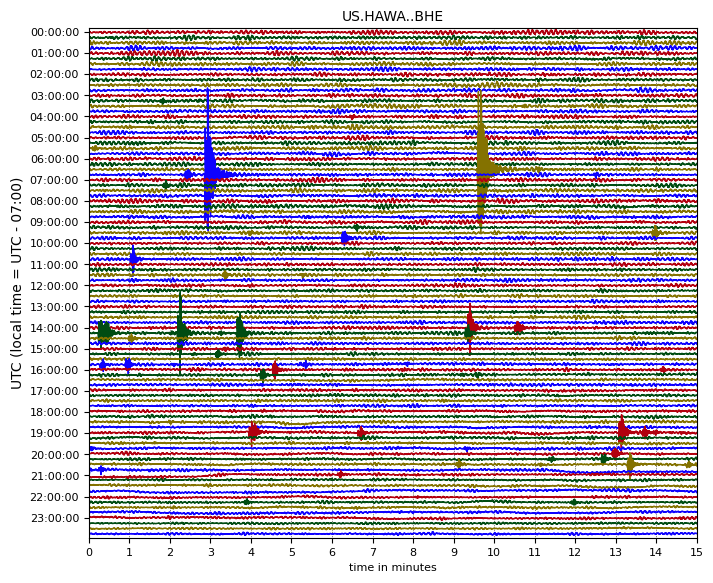

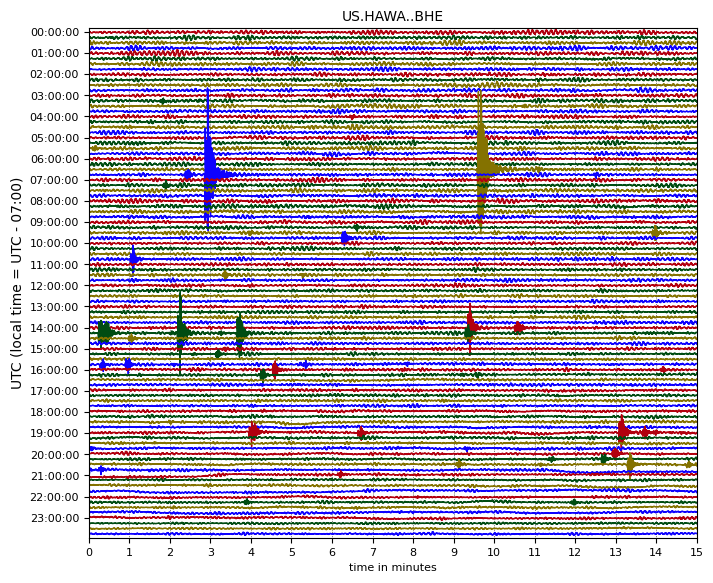

In [62]:
st[0].plot(type = 'dayplot')

In [221]:
best_su

source_type,station_network_code,station_code,date,earthquake,explosion,surface event,total
972,CC,CPCO,2013-01-13,0,0,26,26
973,CC,CPCO,2013-01-14,0,0,25,25
124743,UW,SEP,2004-09-23,0,0,12,12
9129,CC,SEP,2013-09-14,0,0,10,10
124622,UW,SEP,2003-09-04,0,0,10,10
...,...,...,...,...,...,...,...
48010,PB,B941,2020-01-04,1,0,0,1
48009,PB,B941,2020-01-02,1,0,0,1
48008,PB,B941,2020-01-01,2,0,0,2
48007,PB,B941,2019-12-31,1,0,0,1


In [222]:
#model1 = sbm.QuakeXNetoneD.from_pretrained("base")

model1 = sbm.SeismicCNN.from_pretrained("base", version_str = '1')
model2 = sbm.SeismicCNN.from_pretrained("base", version_str = '2')
model3 = sbm.SeismicCNN.from_pretrained("base", version_str = '3')
model4 = sbm.SeismicCNN.from_pretrained("base", version_str = '4')
model5 = sbm.SeismicCNN.from_pretrained("base", version_str = '5')
model6 = sbm.SeismicCNN.from_pretrained("base", version_str = '6')

In [225]:
sns.set_style("whitegrid")
sns.set_context("talk")


start = '2013-09-14T0:0:0'
starttime = obspy.UTCDateTime(start) 
endtime = obspy.UTCDateTime(start) + 24*3600
network = 'CC'
station = 'SEP'
channel = '*H*'
loc = '*'

client = Client('IRIS')
st = client.get_waveforms(starttime = starttime, 
                    endtime = endtime, 
                    network = network, 
                    station = station, 
                    channel = channel, 
                    location = loc)



probs_st = model3.annotate(st, stride = 400) 
probs = np.array(probs_st)

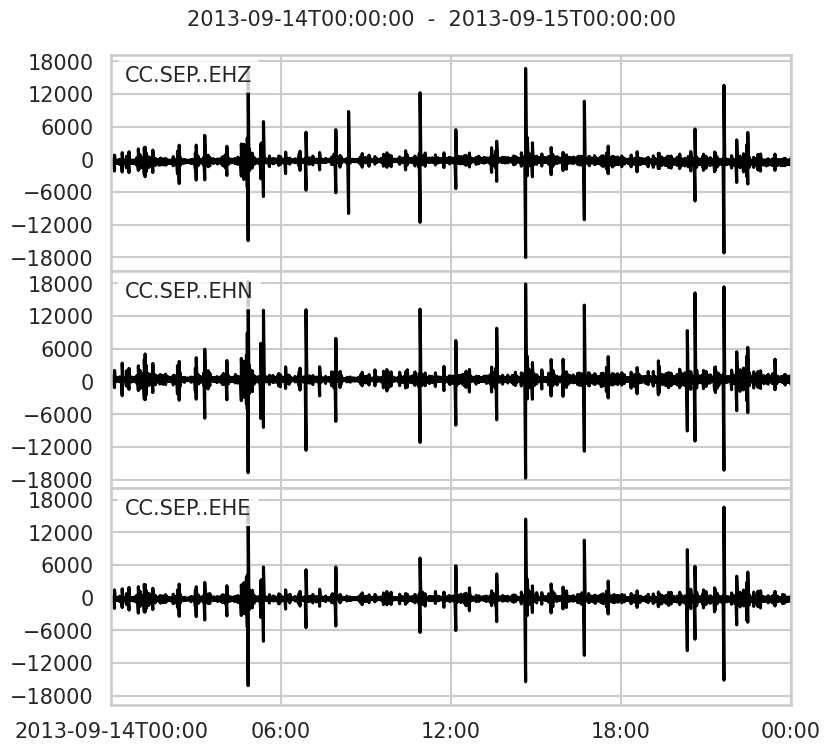

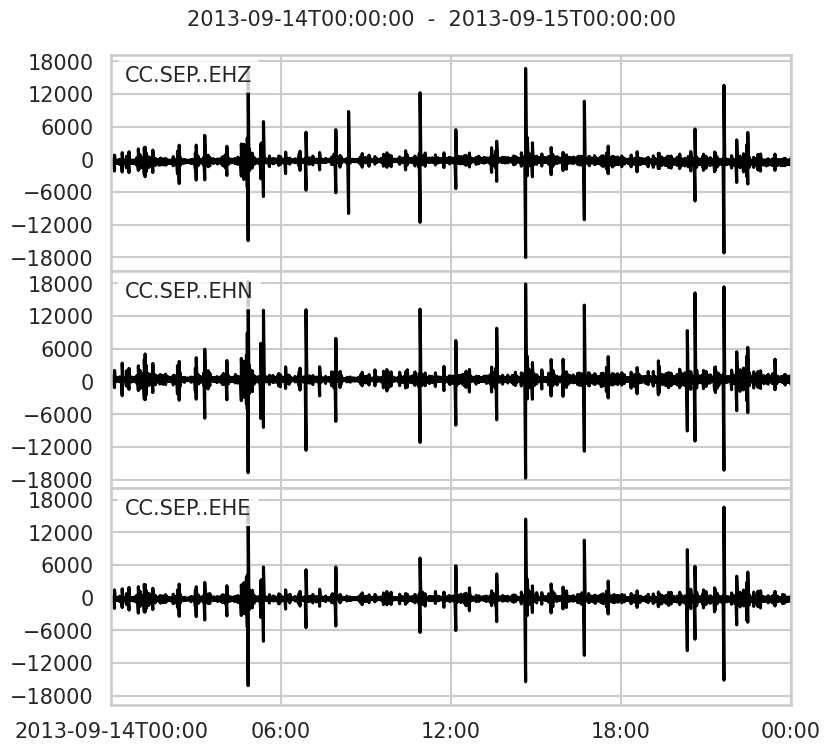

In [226]:
st.plot()

/tmp/ipykernel_456866/3861271792.py:99: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


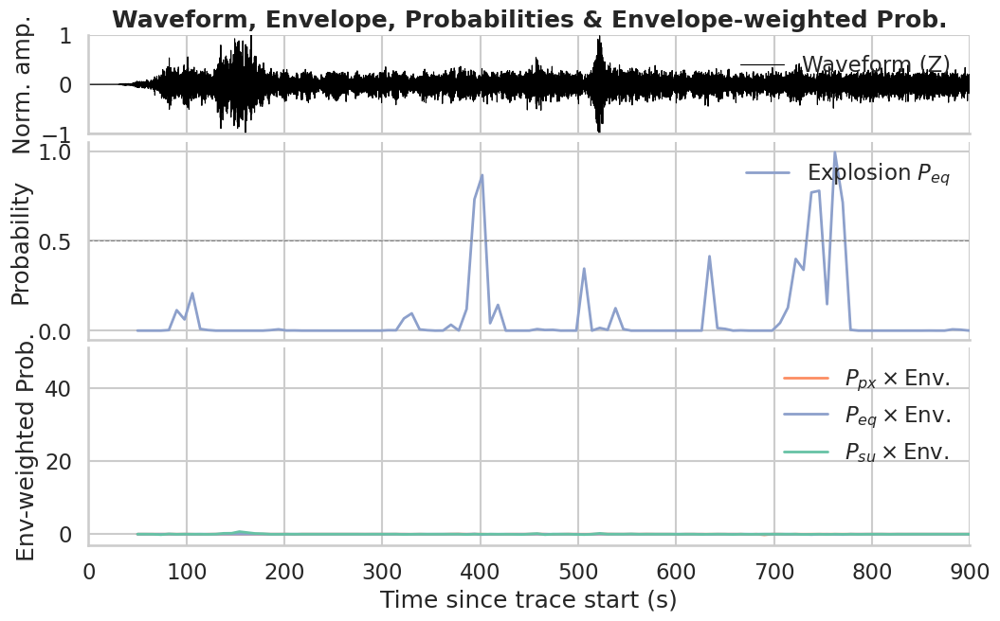

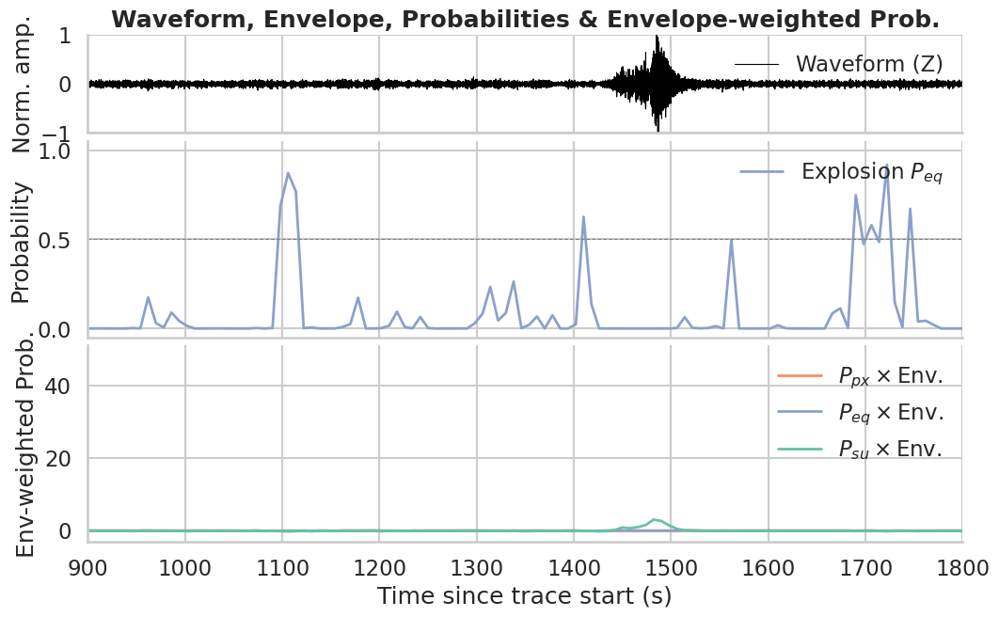

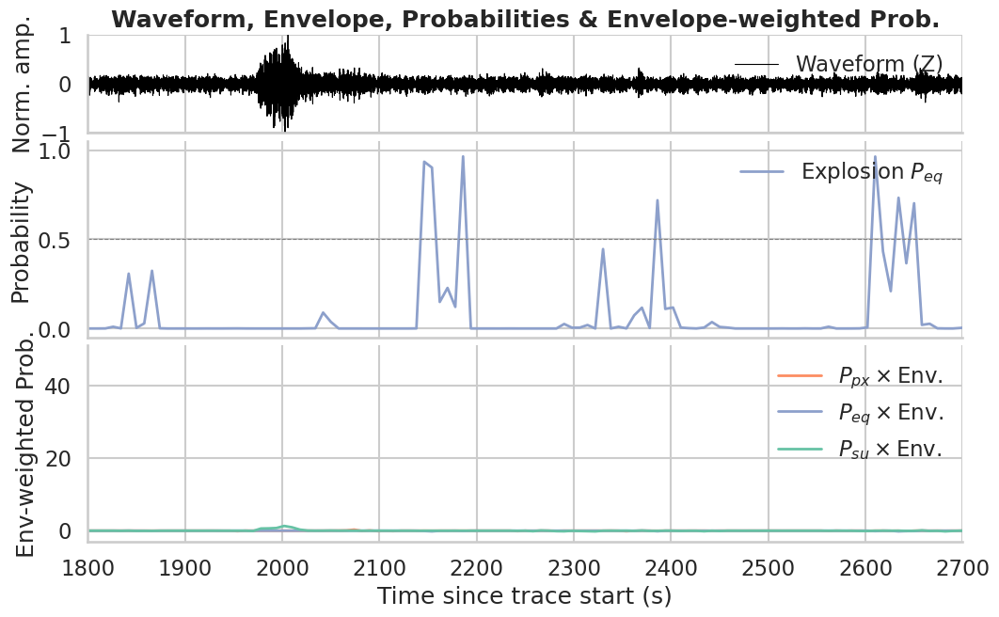

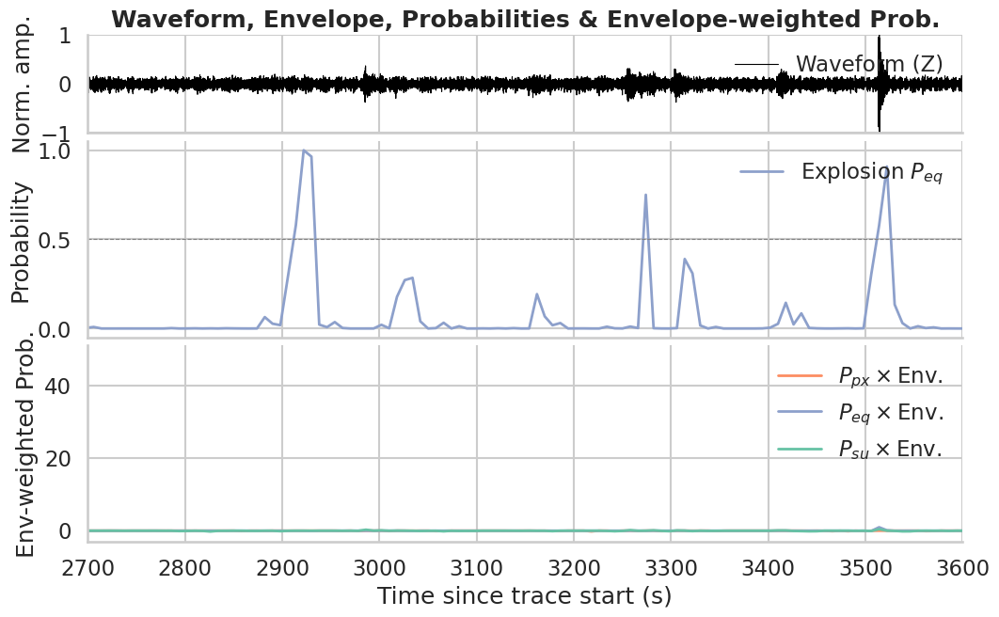

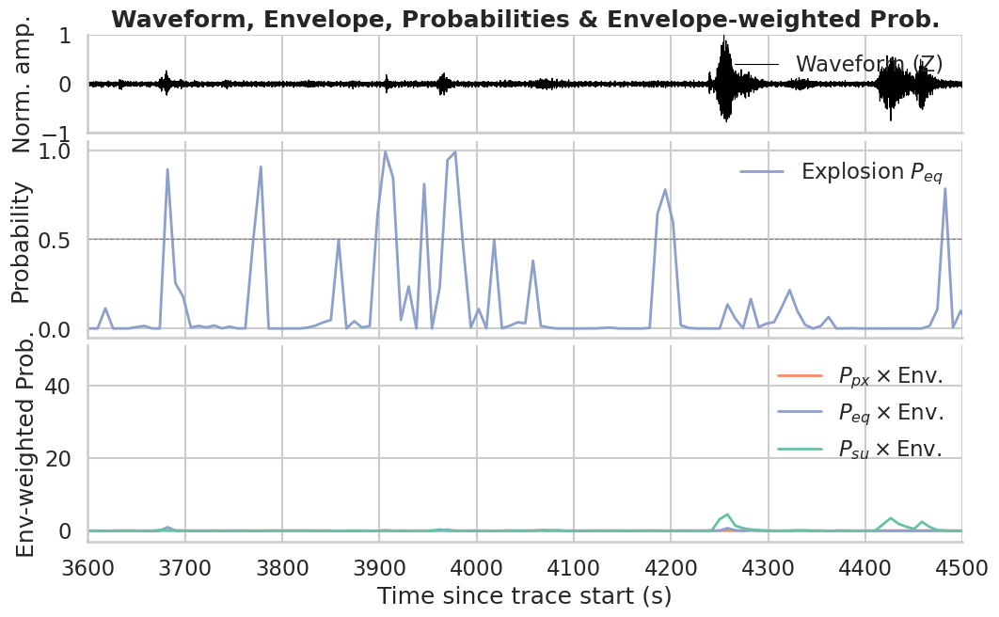

...

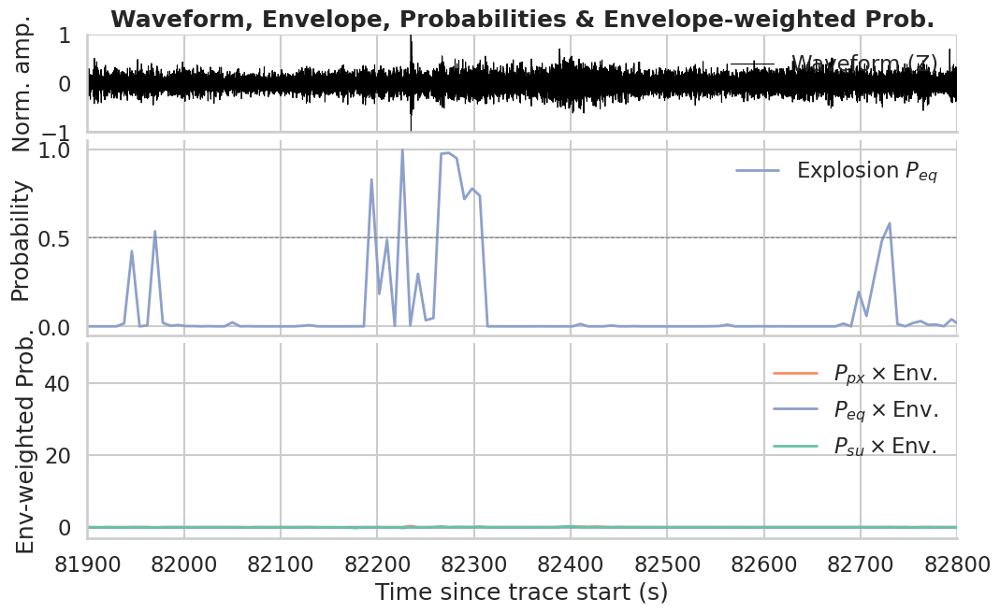

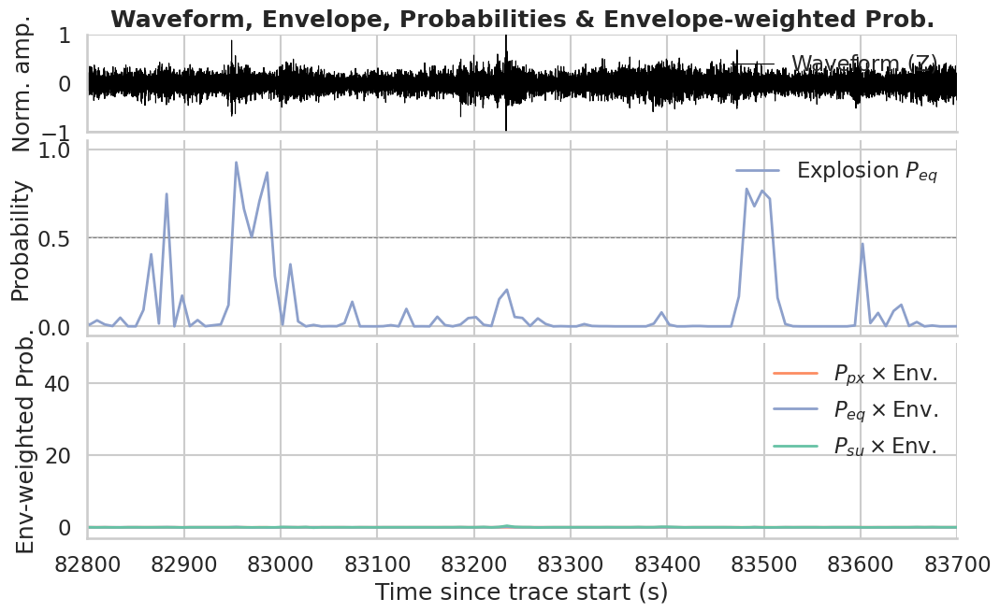

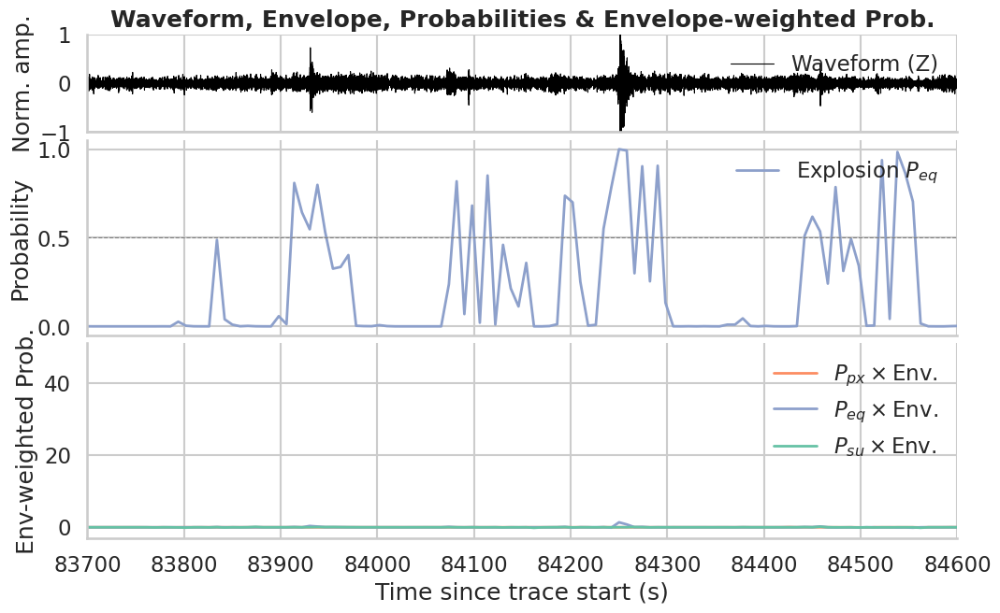

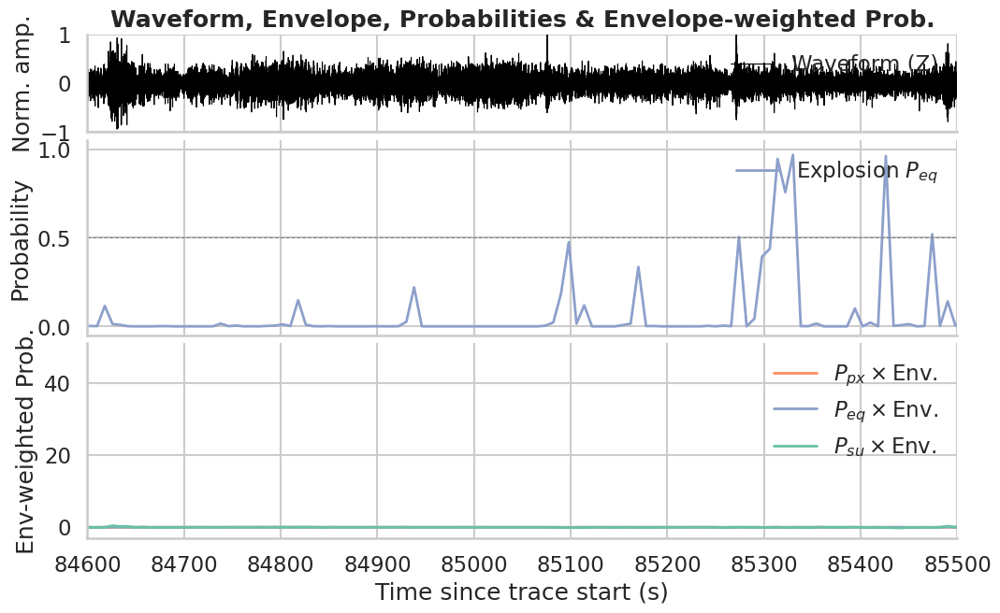

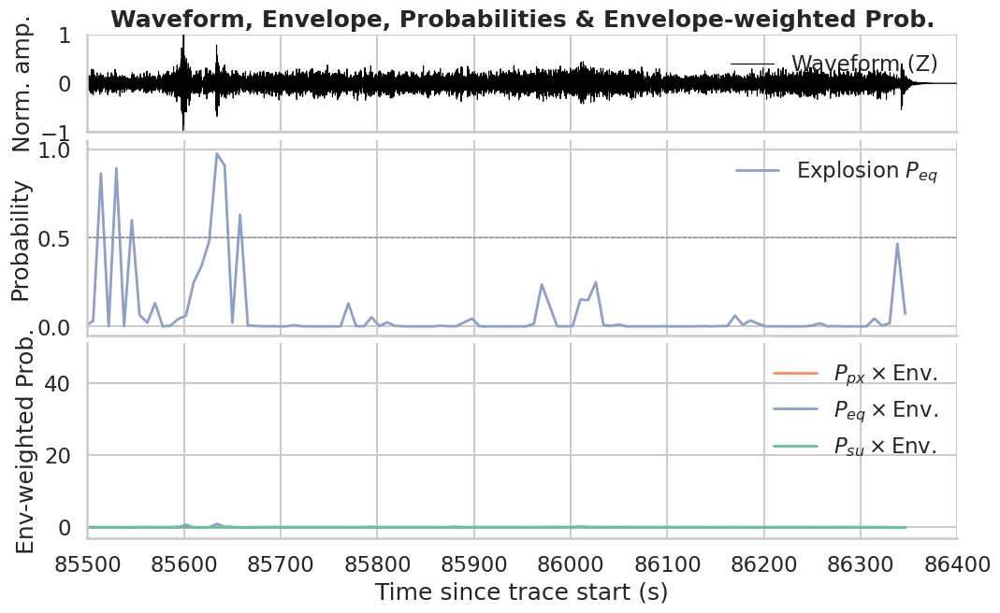

In [229]:
# processing waveforms. 
st.resample(50)
st.detrend('linear')
st.taper(0.001)
st.filter('bandpass', freqmin = 1, freqmax = 10)





# ───── Waveform + smooth envelope ──────────────────────────────────────────
tr_z   = st.select(component="Z")[0]
fs     = tr_z.stats.sampling_rate
wave_t = tr_z.times()
wave_y = tr_z.data  #/ np.abs(tr_z.data).max()



raw_env    = np.abs(hilbert(tr_z.data))
win        = int(5 * fs) | 1            # ~5-s Savitzky window, must be odd
smooth_env = savgol_filter(raw_env, win, 3)


# --- standard-scaler version ----------------------------------------


mu  = smooth_env.mean()
sig = smooth_env.std(ddof=0)        # population σ; use ddof=1 for sample σ
smooth_env = (smooth_env - mu) / sig


# ───── Probabilities (already from model3) ─────────────────────────────────
prob_t  = probs_st[2].times() + 50       # (Nwin,) time stamps
prob_eq = probs[0]
prob_px = probs[1]                       # explosion P_px  (Nwin,)
prob_su = probs[3]                       # surface   P_su  (Nwin,)


# ───── Resample envelope onto prob grid & weight ───────────────────────────
env_resamp = np.interp(prob_t, wave_t, smooth_env)
w_px = prob_px * env_resamp
w_su = prob_su * env_resamp
w_eq = prob_eq * env_resamp


mins = 15
for i in range(int(int(60/mins)*24)):
        # ───── Plot ----------------------------------------------------------------
        fig, (ax0, ax1, ax2) = plt.subplots(
            3, 1, figsize=(12, 7), sharex=True,
            gridspec_kw=dict(height_ratios=[1, 2, 2], hspace=0.05)
        )
        
        w_data = wave_y[int(i*mins*60)*50:int((i+1)*mins*60)*50]

        # 1) waveform + envelope
        ax0.plot(wave_t[int(i*mins*60)*50:int((i+1)*mins*60)*50], w_data/abs(max(w_data)), color="black", lw=0.8, label="Waveform (Z)")
        #ax0.plot(wave_t, smooth_env, color="darkorange", lw=1.4, label="Envelope")
        ax0.set_ylim(-1, 1)
        ax0.set_ylabel("Norm. amp.")
        ax0.set_title("Waveform, Envelope, Probabilities & Envelope-weighted Prob.", weight="bold")
        ax0.legend(frameon=False, loc="upper right")
        ax0.tick_params(axis="x", length=0)

        
        
        # 2) raw probabilities
        #ax1.plot(prob_t, prob_px, lw=2, label="Explosion $P_{px}$",
        #         color=sns.color_palette("Set2")[1])
        ax1.plot(prob_t, prob_eq, lw=2, label="Explosion $P_{eq}$",
                 color=sns.color_palette("Set2")[2])
        #ax1.plot(prob_t, prob_su, lw=2, label="Surface  $P_{su}$",
        #         color=sns.color_palette("Set2")[0])
        ax1.axhline(0.5, color="gray", ls="--", lw=0.8)
        ax1.set_ylabel("Probability")
        #ax1.set_ylim(0, 1.02)
        ax1.legend(frameon=False, loc="upper right")

        # 3) envelope-weighted probabilities
        ax2.plot(prob_t, w_px, lw=2, label="$P_{px}\\times$Env.",
                 color=sns.color_palette("Set2")[1])
        ax2.plot(prob_t, w_eq, lw=2, label="$P_{eq}\\times$Env.",
                 color=sns.color_palette("Set2")[2])
        ax2.plot(prob_t, w_su, lw=2, label="$P_{su}\\times$Env.",
                 color=sns.color_palette("Set2")[0])
        ax2.set_xlabel("Time since trace start (s)")
        ax2.set_ylabel("Env-weighted Prob.")
        #ax2.set_ylim(-1, 2)
        ax2.legend(frameon=False, loc="upper right")




        ax0.set_xlim(i*mins*60, (i+1)*mins*60)
        ax1.set_xlim(i*mins*60, (i+1)*mins*60)
        ax2.set_xlim(i*mins*60, (i+1)*mins*60)
        
        sns.despine()
        plt.tight_layout()
        plt.show()


In [188]:
cat_eq[cat_eq['station_code'] == 'HAWA']

,event_id,source_origin_time,source_latitude_deg,source_longitude_deg,source_type,source_depth_km,preferred_source_magnitude,preferred_source_magnitude_type,preferred_source_magnitude_uncertainty,source_depth_uncertainty_km,source_horizontal_uncertainty_km,station_network_code,station_channel_code,station_code,station_location_code,station_latitude_deg,station_longitude_deg,station_elevation_m,trace_name,trace_sampling_rate_hz,trace_start_time,trace_S_arrival_sample,trace_P_arrival_sample,trace_S_arrival_uncertainty_s,trace_P_arrival_uncertainty_s,trace_P_polarity,trace_S_onset,trace_P_onset,trace_snr_db,source_type_pnsn_label,source_local_magnitude,source_local_magnitude_uncertainty,source_duration_magnitude,source_duration_magnitude_uncertainty,source_hand_magnitude,trace_missing_channel,trace_has_offset,start_dt,date
52,uw10578728,2002-08-31T01:23:39.420000Z,47.419,-120.078,earthquake,11.774,2.00,md,0.040,1.08,0.680,US,BH,HAWA,--,46.392,-119.533,364.0,"bucket7$5,:3,:15001",100,2002-08-31T01:22:49.420000Z,8468,6978,0.10,0.08,undecidable,NaN,NaN,7.6|4.37|5.447,eq,NaN,NaN,2.00,0.040,NaN,0,0,2002-08-31 01:22:49.420000+00:00,2002-08-31
55,uw10578233,2002-08-30T02:03:14.440000Z,46.467,-120.912,earthquake,3.267,2.60,md,0.060,0.94,0.538,US,BH,HAWA,--,46.392,-119.533,364.0,"bucket6$7,:3,:15001",100,2002-08-30T02:02:24.440000Z,8043,6708,0.05,0.10,undecidable,NaN,NaN,14.733|10.489|10.932,eq,NaN,NaN,2.60,0.060,NaN,0,0,2002-08-30 02:02:24.440000+00:00,2002-08-30
193,uw10561033,2002-05-27T19:33:38.770000Z,46.937,-121.968,earthquake,11.236,2.40,md,0.020,0.55,0.269,US,BH,HAWA,--,46.392,-119.533,364.0,"bucket1$16,:3,:15001",100,2002-05-27T19:32:48.770000Z,10497,8156,0.10,0.05,undecidable,NaN,NaN,5.894|10.088|6.539,eq,NaN,NaN,2.40,0.020,NaN,0,0,2002-05-27 19:32:48.770000+00:00,2002-05-27
230,uw10551893,2002-05-07T01:25:43.680000Z,47.721,-120.176,earthquake,-0.713,2.30,md,0.030,0.00,0.562,US,BH,HAWA,--,46.392,-119.533,364.0,"bucket4$32,:3,:15001",100,2002-05-07T01:24:53.680000Z,9463,7548,0.10,0.03,undecidable,NaN,NaN,-1.887|1.26|2.464,eq,NaN,NaN,2.30,0.030,NaN,0,0,2002-05-07 01:24:53.680000+00:00,2002-05-07
319,uw10566913,2002-10-06T19:32:42.310000Z,46.120,-119.447,earthquake,8.397,0.80,md,0.040,2.17,0.305,US,BH,HAWA,--,46.392,-119.533,364.0,"bucket10$33,:3,:15001",100,2002-10-06T19:31:52.310000Z,6065,5603,0.03,0.03,undecidable,NaN,NaN,2.661|-0.95|3.756,eq,NaN,NaN,0.80,0.040,NaN,0,0,2002-10-06 19:31:52.310000+00:00,2002-10-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
182218,uw61855662,2022-07-21T22:32:50.450000Z,46.355,-119.290,earthquake,13.780,1.33,ml,0.093,0.44,0.370,US,BH,HAWA,00,46.392,-119.533,364.0,"bucket10$18468,:3,:15001",100,2022-07-21T22:32:00.450000Z,5747,5472,0.15,0.30,undecidable,emergent,emergent,12.092|12.339|3.367,eq,1.33,0.093,1.06,0.282,NaN,0,0,2022-07-21 22:32:00.450000+00:00,2022-07-21
182754,uw61831482,2022-05-15T07:44:11.630000Z,46.611,-119.851,earthquake,6.590,1.30,ml,0.215,0.16,0.220,US,BH,HAWA,00,46.392,-119.533,364.0,"bucket7$18639,:3,:15001",100,2022-05-15T07:43:21.630000Z,6179,5668,0.06,0.06,undecidable,impulsive,emergent,8.124|16.712|9.24,eq,1.30,0.215,1.05,0.124,NaN,0,0,2022-05-15 07:43:21.630000+00:00,2022-05-15
183055,uw61828367,2022-05-05T23:09:02.450000Z,46.608,-119.844,earthquake,6.610,0.67,ml,0.112,0.24,0.350,US,BH,HAWA,00,46.392,-119.533,364.0,"bucket8$18721,:3,:15001",100,2022-05-05T23:08:12.450000Z,6166,5666,0.15,0.15,undecidable,emergent,emergent,-3.927|1.682|-1.69,eq,0.67,0.112,0.61,0.201,NaN,0,0,2022-05-05 23:08:12.450000+00:00,2022-05-05
183147,uw61815347,2022-03-23T06:13:07.580000Z,46.407,-119.267,earthquake,2.200,1.17,ml,0.189,0.73,0.170,US,BH,HAWA,00,46.392,-119.533,364.0,"bucket9$18658,:3,:15001",100,2022-03-23T06:12:17.580000Z,5712,5404,0.06,0.06,negative,impulsive,impulsive,8.397|10.613|0.728,eq,1.17,0.189,1.07,0.207,NaN,0,0,2022-03-23 06:12:17.580000+00:00,2022-03-23


In [112]:
len(w_eq)

21576

In [114]:
prob_t

array([5.0000e+01, 5.4000e+01, 5.8000e+01, ..., 8.6342e+04, 8.6346e+04,
       8.6350e+04])

## comparing with the standard catalog

In [164]:
det_t = prob_t[np.where(w_eq > 0.3)[0]]

In [165]:
det_times = []


for i in range(len(det_t)):
    det_times.append(starttime+det_t[i])

In [166]:
det_times

[2009-03-18T03:17:02.000000Z,
 2009-03-18T03:17:54.000000Z,
 2009-03-18T04:06:42.000000Z,
 2009-03-18T05:30:18.000000Z,
 2009-03-18T05:30:22.000000Z,
 2009-03-18T06:39:42.000000Z,
 2009-03-18T06:39:46.000000Z,
 2009-03-18T06:39:50.000000Z,
 2009-03-18T06:39:54.000000Z,
 2009-03-18T06:39:58.000000Z,
 2009-03-18T06:40:02.000000Z,
 2009-03-18T06:40:06.000000Z,
 2009-03-18T06:40:18.000000Z,
 2009-03-18T06:40:22.000000Z,
 2009-03-18T06:47:58.000000Z,
 2009-03-18T06:48:02.000000Z,
 2009-03-18T06:48:06.000000Z,
 2009-03-18T06:48:10.000000Z,
 2009-03-18T06:48:14.000000Z,
 2009-03-18T06:48:18.000000Z,
 2009-03-18T06:48:22.000000Z,
 2009-03-18T06:48:38.000000Z,
 2009-03-18T06:57:42.000000Z,
 2009-03-18T07:17:06.000000Z,
 2009-03-18T09:21:46.000000Z,
 2009-03-18T09:34:10.000000Z,
 2009-03-18T09:43:58.000000Z,
 2009-03-18T09:44:06.000000Z,
 2009-03-18T09:44:10.000000Z,
 2009-03-18T09:51:18.000000Z,
 2009-03-18T09:51:22.000000Z,
 2009-03-18T09:51:30.000000Z,
 2009-03-18T09:51:34.000000Z,
 2009-03-1

In [167]:
cat_eq

,event_id,source_origin_time,source_latitude_deg,source_longitude_deg,source_type,source_depth_km,preferred_source_magnitude,preferred_source_magnitude_type,preferred_source_magnitude_uncertainty,source_depth_uncertainty_km,source_horizontal_uncertainty_km,station_network_code,station_channel_code,station_code,station_location_code,station_latitude_deg,station_longitude_deg,station_elevation_m,trace_name,trace_sampling_rate_hz,trace_start_time,trace_S_arrival_sample,trace_P_arrival_sample,trace_S_arrival_uncertainty_s,trace_P_arrival_uncertainty_s,trace_P_polarity,trace_S_onset,trace_P_onset,trace_snr_db,source_type_pnsn_label,source_local_magnitude,source_local_magnitude_uncertainty,source_duration_magnitude,source_duration_magnitude_uncertainty,source_hand_magnitude,trace_missing_channel,trace_has_offset,start_dt,date
0,uw10564613,2002-10-03T01:56:49.530000Z,48.553,-122.520,earthquake,14.907,2.10,md,0.030,1.68,0.694,UW,BH,GNW,--,47.564,-122.825,220.0,"bucket4$0,:3,:15001",100,2002-10-03T01:55:59.530000Z,8097,6733,0.04,0.02,undecidable,NaN,NaN,6.135|3.065|11.766,eq,NaN,NaN,2.10,0.030,NaN,0,1,2002-10-03 01:55:59.530000+00:00,2002-10-03
1,uw10564613,2002-10-03T01:56:49.530000Z,48.553,-122.520,earthquake,14.907,2.10,md,0.030,1.68,0.694,UW,EH,RPW,--,48.448,-121.515,850.0,"bucket9$0,:3,:15001",100,2002-10-03T01:55:59.530000Z,7258,6238,0.04,0.01,undecidable,NaN,NaN,nan|nan|22.583,eq,NaN,NaN,2.10,0.030,NaN,2,0,2002-10-03 01:55:59.530000+00:00,2002-10-03
2,uw10564613,2002-10-03T01:56:49.530000Z,48.553,-122.520,earthquake,14.907,2.10,md,0.030,1.68,0.694,UW,BH,SQM,--,48.074,-123.048,45.0,"bucket4$1,:3,:15001",100,2002-10-03T01:55:59.530000Z,7037,6113,0.08,0.04,undecidable,NaN,NaN,1.756|3.057|3.551,eq,NaN,NaN,2.10,0.030,NaN,0,1,2002-10-03 01:55:59.530000+00:00,2002-10-03
3,uw10564613,2002-10-03T01:56:49.530000Z,48.553,-122.520,earthquake,14.907,2.10,md,0.030,1.68,0.694,UW,EH,MCW,--,48.679,-122.833,693.0,"bucket7$0,:3,:15001",100,2002-10-03T01:55:59.530000Z,5894,5442,0.04,0.01,negative,NaN,NaN,nan|nan|27.185,eq,NaN,NaN,2.10,0.030,NaN,2,0,2002-10-03 01:55:59.530000+00:00,2002-10-03
4,uw10568748,2002-09-26T07:00:04.860000Z,48.481,-123.133,earthquake,22.748,2.90,md,0.030,0.91,0.672,UW,HH,SP2,--,47.556,-122.249,30.0,"bucket3$0,:3,:15001",100,2002-09-26T06:59:14.860000Z,8647,6948,0.04,0.01,negative,NaN,NaN,10.881|17.107|2.242,eq,NaN,NaN,2.90,0.030,NaN,0,1,2002-09-26 06:59:14.860000+00:00,2002-09-26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183904,uw61802032,2022-01-15T01:30:38.770000Z,48.617,-123.032,earthquake,12.410,0.26,md,0.416,0.74,0.390,UW,HH,RNWY,--,48.612,-123.126,58.2,"bucket9$18743,:3,:15001",100,2022-01-15T01:29:48.770000Z,5410,5212,0.03,0.03,positive,impulsive,impulsive,17.389|11.516|12.029,eq,NaN,NaN,0.26,0.416,NaN,0,0,2022-01-15 01:29:48.770000+00:00,2022-01-15
183905,uw61802032,2022-01-15T01:30:38.770000Z,48.617,-123.032,earthquake,12.410,0.26,md,0.416,0.74,0.390,UW,HH,OLGA,--,48.605,-122.803,21.9,"bucket6$18496,:3,:15001",100,2022-01-15T01:29:48.770000Z,5617,5332,0.06,0.03,negative,impulsive,impulsive,9.564|8.578|2.713,eq,NaN,NaN,0.26,0.416,NaN,0,0,2022-01-15 01:29:48.770000+00:00,2022-01-15
183906,uw61802032,2022-01-15T01:30:38.770000Z,48.617,-123.032,earthquake,12.410,0.26,md,0.416,0.74,0.390,UW,HH,LOPEZ,--,48.437,-122.887,10.5,"bucket4$18762,:3,:15001",100,2022-01-15T01:29:48.770000Z,5763,5415,0.03,0.03,negative,impulsive,impulsive,6.539|-0.560|-0.724,eq,NaN,NaN,0.26,0.416,NaN,0,0,2022-01-15 01:29:48.770000+00:00,2022-01-15
183907,uw61802032,2022-01-15T01:30:38.770000Z,48.617,-123.032,earthquake,12.410,0.26,md,0.416,0.74,0.390,UW,HH,LUMI,--,48.720,-122.706,19.4,"bucket4$18763,:3,:15001",100,2022-01-15T01:29:48.770000Z,5847,5462,0.06,0.15,undecidable,impulsive,emergent,3.382|1.918|2.539,eq,NaN,NaN,0.26,0.416,NaN,0,0,2022-01-15 01:29:48.770000+00:00,2022-01-15


In [168]:
cat_eq["start_dt"] = pd.to_datetime(cat_eq["trace_start_time"])
cat_eq["date"]     = cat_eq["start_dt"].dt.date

/home/ak287/miniconda3/envs/surface/lib/python3.9/site-packages/pandas/core/frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


In [169]:
from datetime import date

sot = cat_eq[(cat_eq['station_code'] == 'HAWA') & (cat_eq['date'] == date(2009,3,18))]['source_origin_time'].values

In [170]:
sot[0]

'2009-03-18T06:39:31.890000Z'

In [171]:
det_times[0]

2009-03-18T03:17:02.000000Z

In [172]:
sot

array(['2009-03-18T06:39:31.890000Z', '2009-03-18T14:17:07.990000Z',
       '2009-03-18T14:15:10.960000Z', '2009-03-18T06:47:48.240000Z',
       '2009-03-18T22:18:46.700000Z', '2009-03-18T20:46:22.300000Z',
       '2009-03-18T20:43:13.330000Z', '2009-03-18T20:26:17.210000Z',
       '2009-03-18T19:54:11.690000Z', '2009-03-18T19:21:38.000000Z',
       '2009-03-18T19:13:00.870000Z', '2009-03-18T19:03:53.760000Z',
       '2009-03-18T16:04:28.930000Z', '2009-03-18T14:42:57.770000Z',
       '2009-03-18T14:18:36.260000Z', '2009-03-18T10:45:58.350000Z',
       '2009-03-18T09:33:52.700000Z', '2009-03-18T06:57:23.070000Z',
       '2009-03-18T06:40:57.790000Z', '2009-03-18T23:14:27.840000Z',
       '2009-03-18T22:31:57.910000Z', '2009-03-18T22:26:50.350000Z',
       '2009-03-18T22:07:59.110000Z', '2009-03-18T20:45:11.100000Z',
       '2009-03-18T20:44:40.190000Z', '2009-03-18T20:41:01.360000Z',
       '2009-03-18T20:38:59.950000Z', '2009-03-18T20:12:51.210000Z',
       '2009-03-18T19:44:56.860000

In [173]:
from obspy import UTCDateTime

# Convert SOT strings to UTCDateTime objects
sot_utc = [UTCDateTime(t) for t in sot]

# Count how many SOT entries have at least one detection within ±20 seconds
count = sum(any(abs(det - sot_time) <= 20 for det in det_times) for sot_time in sot_utc)

print(f"{count} out of {len(sot)} SOT entries had at least one detection within ±20s.")

43 out of 66 SOT entries had at least one detection within ±20s.


In [163]:
det_times

[2009-03-18T03:17:02.000000Z,
 2009-03-18T04:06:42.000000Z,
 2009-03-18T05:30:18.000000Z,
 2009-03-18T05:30:22.000000Z,
 2009-03-18T06:39:42.000000Z,
 2009-03-18T06:39:46.000000Z,
 2009-03-18T06:39:50.000000Z,
 2009-03-18T06:39:54.000000Z,
 2009-03-18T06:39:58.000000Z,
 2009-03-18T06:40:02.000000Z,
 2009-03-18T06:40:06.000000Z,
 2009-03-18T06:40:18.000000Z,
 2009-03-18T06:47:58.000000Z,
 2009-03-18T06:48:02.000000Z,
 2009-03-18T06:48:06.000000Z,
 2009-03-18T06:48:10.000000Z,
 2009-03-18T06:48:14.000000Z,
 2009-03-18T06:48:18.000000Z,
 2009-03-18T06:48:22.000000Z,
 2009-03-18T06:48:38.000000Z,
 2009-03-18T06:57:42.000000Z,
 2009-03-18T07:17:06.000000Z,
 2009-03-18T09:21:46.000000Z,
 2009-03-18T09:34:10.000000Z,
 2009-03-18T09:44:06.000000Z,
 2009-03-18T09:44:10.000000Z,
 2009-03-18T09:51:18.000000Z,
 2009-03-18T09:51:22.000000Z,
 2009-03-18T09:51:30.000000Z,
 2009-03-18T09:51:34.000000Z,
 2009-03-18T10:46:10.000000Z,
 2009-03-18T10:46:18.000000Z,
 2009-03-18T10:46:22.000000Z,
 2009-03-1

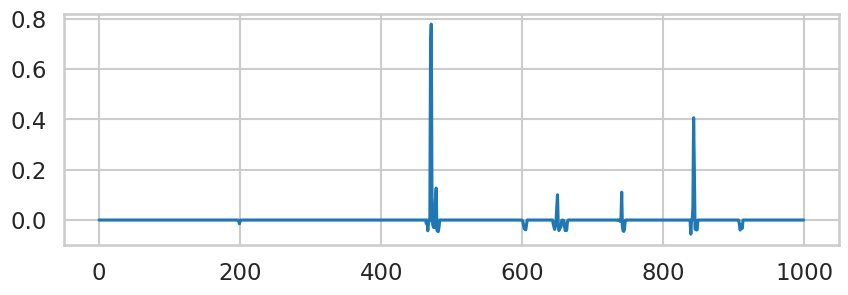

In [211]:
plt.figure(figsize = [10,3])
plt.plot(w_eq[1000:2000])
#plt.ylim(0,0.5)

In [176]:
w_eq

array([-2.13943121e-06, -9.51411818e-07, -2.06833853e-06, ...,
       -3.19738028e-06, -3.70730545e-05, -3.84876151e-07])

array([-0.05626175, -0.05626175, -0.05626175, ..., -0.05626175,
       -0.05626175, -0.05626175])

In [200]:
w_eq

array([-2.03951439e-06, -9.06978492e-07, -1.97174192e-06, ...,
       -3.04805458e-06, -3.53416496e-05, -3.66901466e-07])

In [201]:
from scipy.ndimage import uniform_filter1d

W = w_eq 
# Smooth W to create a baseline
W_smooth = uniform_filter1d(W, size=100)

# Local mean and std
mu = uniform_filter1d(W, size=100)
sigma = uniform_filter1d(W**2, size=100)**0.5

# Z-score normalization
W_norm = (W - mu) / (sigma + 1e-8)  # avoid division by zero


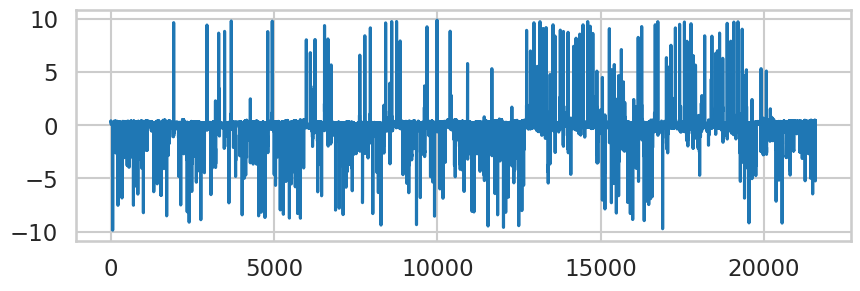

In [204]:
plt.figure(figsize = [10,3])
plt.plot(W_norm)